Please note, this notebook uses some functionalities that are out of date when it comes to using azure machine learning pipelines. More updated variants can be found [here](https://github.com/Azure/azureml-examples). 

The notebook is an expansion on [using automl to build regression models](https://github.com/Azure/MachineLearningNotebooks/blob/master/tutorials/regression-automl-nyc-taxi-data/regression-automated-ml.ipynb)

In [1]:
import azureml.core
from azureml.core import Environment, Dataset, Workspace, Model
from azureml.opendatasets import NycTlcGreen, NycTlcYellow

import os
import pandas as pd
from datetime import datetime
from dateutil.relativedelta import relativedelta

#compute
from azureml.core.compute import ComputeTarget, AmlCompute
from azureml.core.runconfig import DockerConfiguration,RunConfiguration
from azureml.core.conda_dependencies import CondaDependencies

# pipelines

from azureml.pipeline.core import PipelineData, Pipeline
from azureml.pipeline.steps import PythonScriptStep


# AutoML + modelling
from azureml.core import Experiment
from azureml.train.automl import AutoMLConfig
from azureml.widgets import RunDetails



In [2]:
green_df_raw = pd.DataFrame([])
start = datetime.strptime("1/1/2016","%m/%d/%Y")
end = datetime.strptime("1/31/2016","%m/%d/%Y")

number_of_months = 1
sample_size = 5000

for sample_month in range(number_of_months):
    temp_df_green = NycTlcGreen(start + relativedelta(months=sample_month), end + relativedelta(months=sample_month)) \
        .to_pandas_dataframe()
    green_df_raw = green_df_raw.append(temp_df_green.sample(sample_size))
yellow_df_raw = pd.DataFrame([])
start = datetime.strptime("1/1/2016","%m/%d/%Y")
end = datetime.strptime("1/31/2016","%m/%d/%Y")

sample_size = 500

for sample_month in range(number_of_months):
    temp_df_yellow = NycTlcYellow(start + relativedelta(months=sample_month), end + relativedelta(months=sample_month)) \
        .to_pandas_dataframe()
    yellow_df_raw = yellow_df_raw.append(temp_df_yellow.sample(sample_size))


[Info] read from /tmp/tmpsb4jnap4/https%3A/%2Fazureopendatastorage.azurefd.net/nyctlc/green/puYear=2016/puMonth=1/part-00119-tid-4753095944193949832-fee7e113-666d-4114-9fcb-bcd3046479f3-2689-1.c000.snappy.parquet
[Info] read from /tmp/tmprzxihtf_/https%3A/%2Fazureopendatastorage.azurefd.net/nyctlc/yellow/puYear=2016/puMonth=1/part-00000-tid-8898858832658823408-a1de80bd-eed3-4d11-b9d4-fa74bfbd47bc-426339-90.c000.snappy.parquet
[Info] read from /tmp/tmprzxihtf_/https%3A/%2Fazureopendatastorage.azurefd.net/nyctlc/yellow/puYear=2016/puMonth=1/part-00001-tid-8898858832658823408-a1de80bd-eed3-4d11-b9d4-fa74bfbd47bc-426336-89.c000.snappy.parquet
[Info] read from /tmp/tmprzxihtf_/https%3A/%2Fazureopendatastorage.azurefd.net/nyctlc/yellow/puYear=2016/puMonth=1/part-00002-tid-8898858832658823408-a1de80bd-eed3-4d11-b9d4-fa74bfbd47bc-426334-91.c000.snappy.parquet
[Info] read from /tmp/tmprzxihtf_/https%3A/%2Fazureopendatastorage.azurefd.net/nyctlc/yellow/puYear=2016/puMonth=1/part-00003-tid-889885

In [9]:
yellow_df_raw.head(10)

,vendorID,tpepPickupDateTime,tpepDropoffDateTime,passengerCount,tripDistance,puLocationId,doLocationId,startLon,startLat,endLon,...,rateCodeId,storeAndFwdFlag,paymentType,fareAmount,extra,mtaTax,improvementSurcharge,tipAmount,tollsAmount,totalAmount
435978,2,2016-01-30 20:09:48,2016-01-30 20:43:45,1,5.66,None,None,-74.008553,40.719818,-73.937050,...,1,N,1,25.0,0.5,0.5,0.3,5.26,0.00,31.56
280913,1,2016-01-05 01:02:01,2016-01-05 01:16:22,1,3.00,None,None,-73.989311,40.731659,-73.964821,...,1,N,2,12.5,0.5,0.5,0.3,0.00,0.00,13.80
251005,2,2016-01-08 18:52:30,2016-01-08 19:13:05,1,2.69,None,None,-73.951843,40.781170,-73.980370,...,1,N,1,14.5,1.0,0.5,0.3,3.26,0.00,19.56
489102,1,2016-01-30 00:02:13,2016-01-30 00:16:18,1,5.00,None,None,-73.955254,40.772938,-73.985100,...,1,N,1,17.0,0.5,0.5,0.3,2.00,0.00,20.30
433392,1,2016-01-08 10:18:07,2016-01-08 10:44:19,1,10.10,None,None,-73.871048,40.773750,-73.970673,...,1,N,1,30.0,0.0,0.5,0.3,9.05,5.54,45.39
71265,2,2016-01-26 19:43:08,2016-01-26 20:32:25,5,22.07,None,None,-73.784218,40.648609,-73.983185,...,2,N,2,52.0,0.0,0.5,0.3,0.00,5.54,58.34
120178,1,2016-01-11 14:51:11,2016-01-11 14:56:46,1,0.80,None,None,-73.975319,40.790257,-73.983406,...,1,N,2,6.0,0.0,0.5,0.3,0.00,0.00,6.80
115283,1,2016-01-15 06:04:43,2016-01-15 06:14:51,2,1.50,None,None,-73.977066,40.775394,-73.960861,...,1,N,1,9.5,0.0,0.5,0.3,2.55,0.00,12.85
344691,1,2016-01-09 11:37:17,2016-01-09 11:44:31,1,0.90,None,None,-73.995140,40.739899,-73.991325,...,1,N,1,6.5,0.0,0.5,0.3,2.15,0.00,9.45
437205,1,2016-01-12 12:49:30,2016-01-12 12:56:07,1,0.60,None,None,-73.994652,40.734516,-73.993172,...,1,N,1,6.0,0.0,0.5,0.3,1.00,0.00,7.80


In [10]:
green_df_raw

,vendorID,lpepPickupDatetime,lpepDropoffDatetime,passengerCount,tripDistance,puLocationId,doLocationId,pickupLongitude,pickupLatitude,dropoffLongitude,...,paymentType,fareAmount,extra,mtaTax,improvementSurcharge,tipAmount,tollsAmount,ehailFee,totalAmount,tripType
1319107,2,2016-01-03 14:52:25,2016-01-03 15:14:43,6,4.39,None,None,-73.989273,40.669533,-73.934639,...,2,18.5,0.0,0.5,0.3,0.00,0.0,NaN,19.30,1.0
444242,2,2016-01-08 09:24:10,2016-01-08 09:30:49,1,1.03,None,None,-73.980492,40.688377,-73.982796,...,1,6.5,0.0,0.5,0.3,0.00,0.0,NaN,7.30,1.0
501362,2,2016-01-09 19:50:57,2016-01-09 20:26:31,5,8.46,None,None,-73.986687,40.678837,-73.990234,...,1,30.0,0.0,0.5,0.3,6.16,0.0,NaN,36.96,1.0
38958,1,2016-01-04 11:38:10,2016-01-04 11:50:24,1,2.40,None,None,-73.957146,40.664818,-73.976410,...,1,11.0,0.0,0.5,0.3,2.00,0.0,NaN,13.80,1.0
398694,2,2016-01-04 18:57:09,2016-01-04 19:01:44,1,1.26,None,None,-73.911911,40.775257,-73.915504,...,1,6.0,1.0,0.5,0.3,3.00,0.0,NaN,10.80,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
900538,2,2016-01-05 13:03:43,2016-01-05 13:22:37,1,2.19,None,None,-73.964645,40.696896,-73.991997,...,1,13.5,0.0,0.5,0.3,2.86,0.0,NaN,17.16,1.0
604758,2,2016-01-27 03:35:38,2016-01-27 03:38:57,1,0.78,None,None,-73.921425,40.766613,-73.934418,...,2,4.5,0.5,0.5,0.3,0.00,0.0,NaN,5.80,1.0
183443,2,2016-01-26 15:25:54,2016-01-26 15:45:31,1,3.35,None,None,-73.949615,40.793499,-73.926361,...,1,15.0,0.0,0.5,0.3,2.00,0.0,NaN,17.80,1.0
1338297,2,2016-01-03 23:33:36,2016-01-03 23:49:44,1,9.97,None,None,-73.913551,40.765568,-73.805382,...,2,32.0,0.0,0.0,0,0.00,0.0,NaN,32.00,2.0


# Download Locally then place it in azure blob storage + register datasets

In [3]:
dataDir = "data"

if not os.path.exists(dataDir):
    os.mkdir(dataDir)

greenDir = dataDir + "/green"
yelloDir = dataDir + "/yellow"

if not os.path.exists(greenDir):
    os.mkdir(greenDir)
    
if not os.path.exists(yelloDir):
    os.mkdir(yelloDir)
    
greenTaxiData = greenDir + "/unprepared.parquet"
yellowTaxiData = yelloDir + "/unprepared.parquet"



print("Data written to local folder.")

from azureml.core import Workspace



Data written to local folder.


In [5]:
ws = Workspace.from_config()
print("Workspace: " + ws.name, "Region: " + ws.location, sep = '\n')

default_store = ws.get_default_datastore() 


green_df_raw.to_csv(greenTaxiData, index=False)
yellow_df_raw.to_csv(yellowTaxiData, index=False)

# Default datastore

default_store.upload_files([greenTaxiData], 
                           target_path = 'green', 
                           overwrite = True, 
                           show_progress = True)

default_store.upload_files([yellowTaxiData], 
                           target_path = 'yellow', 
                           overwrite = True, 
                           show_progress = True)

print("Upload calls completed.")

# registering it to datastore + dataset
green_taxi_data = Dataset.Tabular.from_delimited_files(default_store.path('green/unprepared.parquet'))
yellow_taxi_data = Dataset.Tabular.from_delimited_files(default_store.path('yellow/unprepared.parquet'))

green_taxi_data = green_taxi_data.register(ws, 'green_taxi_data')
yellow_taxi_data = yellow_taxi_data.register(ws, 'yellow_taxi_data')

Workspace: training-ml104
Region: westeurope
Uploading an estimated of 1 files
Uploading data/green/unprepared.parquet
Uploaded data/green/unprepared.parquet, 1 files out of an estimated total of 1
Uploaded 1 files
Uploading an estimated of 1 files
Uploading data/yellow/unprepared.parquet
Uploaded data/yellow/unprepared.parquet, 1 files out of an estimated total of 1
Uploaded 1 files
Upload calls completed.


"datastore.upload_files" is deprecated after version 1.0.69. Please use "FileDatasetFactory.upload_directory" instead. See Dataset API change notice at https://aka.ms/dataset-deprecation.


In [5]:
green_taxi_data

{
  "source": [
    "('workspaceblobstore', 'green/unprepared.parquet')"
  ],
  "definition": [
    "GetDatastoreFiles",
    "ParseDelimited",
    "DropColumns",
    "SetColumnTypes"
  ],
  "registration": {
    "id": "d3ddbd69-f1de-4590-9c31-f3fcfbca543b",
    "name": "green_taxi_data",
    "version": 1,
    "workspace": "Workspace.create(name='training-ml104', subscription_id='40fd749f-c876-4e1e-87c0-835314a59e42', resource_group='dp100-main-demo')"
  }
}

# lets set up our compute environment

## our compute: fun_name

- packages: pandas, scikit-learn and automl, pyarrow for the pipeline steps. Defining the runconfig for tha

In [6]:

cluster_name = 'LittleVmBoiTheSecond'

aml_compute = ComputeTarget(workspace=ws, name=cluster_name)

# Create a new runconfig object

docker_config = DockerConfiguration(
    use_docker=True)

from_notebook_env = Environment('m7_demo_env')

deps = CondaDependencies.create(
    conda_packages=['pandas','scikit-learn'], 
    pip_packages=['azureml-sdk[automl]', 'pyarrow'])

from_notebook_env.python.conda_dependencies = deps
#from_notebook_env.register(workspace=ws)


# Create a new runconfig object
aml_run_config = RunConfiguration()

# Use the aml_compute you created above. 
aml_run_config.target = aml_compute

# Enable Docker
aml_run_config.environment.docker.enabled = True

# Use conda_dependencies.yml to create a conda environment in the Docker image for execution
aml_run_config.environment.python.user_managed_dependencies = False

# Specify CondaDependencies obj, add necessary packages
aml_run_config.environment.python.conda_dependencies = deps

print ("Run configuration created.")

'enabled' is deprecated. Please use the azureml.core.runconfig.DockerConfiguration object with the 'use_docker' param instead.


Now we will prepare for regression modeling by using pandas. We run various transformations to filter and combine two different NYC taxi datasets.

We achieve this by creating a separate step for each transformation as this allows us to reuse the steps and saves us from running all over again in case of any change. We will keep data preparation scripts in one subfolder and training scripts in another.

The best practice is to use separate folders for scripts and its dependent files for each step and specify that folder as the source_directory for the step. This helps reduce the size of the snapshot created for the step (only the specific folder is snapshotted). Since changes in any files in the source_directory would trigger a re-upload of the snapshot, this helps keep the reuse of the step when there are no changes in the source_directory of the step.

# Pipeline step: 
1. select useful columns in yellow and green taxi data
2. join datasets
3. filter data
4. normalise data
5. transform month variables
6. split data

### step 1: selection of columns

In [12]:
useful_columns = str(["cost", "distance", "dropoff_datetime", "dropoff_latitude", 
                      "dropoff_longitude", "passengers", "pickup_datetime", 
                      "pickup_latitude", "pickup_longitude", "store_forward", "vendor"]).replace(",", ";")


# python scripts folder
prepare_data_folder = './main/scripts/data_prep'

# rename columns as per Azure Machine Learning NYC Taxi tutorial
green_columns = str({ 
    "vendorID": "vendor",
    "lpepPickupDatetime": "pickup_datetime",
    "lpepDropoffDatetime": "dropoff_datetime",
    "storeAndFwdFlag": "store_forward",
    "pickupLongitude": "pickup_longitude",
    "pickupLatitude": "pickup_latitude",
    "dropoffLongitude": "dropoff_longitude",
    "dropoffLatitude": "dropoff_latitude",
    "passengerCount": "passengers",
    "fareAmount": "cost",
    "tripDistance": "distance"
}).replace(",", ";")

# Define output after cleansing step
cleansed_green_data = PipelineData("cleansed_green_data", datastore=default_store).as_dataset()

print('Cleanse script is in {}.'.format(os.path.realpath(prepare_data_folder)))

# cleansing step creation
# See the cleanse.py for details about input and output
cleansingStepGreen = PythonScriptStep(
    name="Cleanse Green Taxi Data",
    script_name="cleanse.py", 
    arguments=["--useful_columns", useful_columns,
               "--columns", green_columns,
               "--output_cleanse", cleansed_green_data],
    inputs=[green_taxi_data.as_named_input('raw_data')],
    outputs=[cleansed_green_data],
    compute_target=aml_compute,
    runconfig=aml_run_config,
    source_directory=prepare_data_folder,
    allow_reuse=True
)

### YELLOW TAXI DATA

yellow_columns = str({
    "vendorID": "vendor",
    "tpepPickupDateTime": "pickup_datetime",
    "tpepDropoffDateTime": "dropoff_datetime",
    "storeAndFwdFlag": "store_forward",
    "startLon": "pickup_longitude",
    "startLat": "pickup_latitude",
    "endLon": "dropoff_longitude",
    "endLat": "dropoff_latitude",
    "passengerCount": "passengers",
    "fareAmount": "cost",
    "tripDistance": "distance"
}).replace(",", ";")

# Define output after cleansing step
cleansed_yellow_data = PipelineData("cleansed_yellow_data", datastore=default_store).as_dataset()

print('Cleanse script is in {}.'.format(os.path.realpath(prepare_data_folder)))

# cleansing step creation
# See the cleanse.py for details about input and output
cleansingStepYellow = PythonScriptStep(
    name="Cleanse Yellow Taxi Data",
    script_name="cleanse.py", 
    arguments=["--useful_columns", useful_columns,
               "--columns", yellow_columns,
               "--output_cleanse", cleansed_yellow_data],
    inputs=[yellow_taxi_data.as_named_input('raw_data')],
    outputs=[cleansed_yellow_data],
    compute_target=aml_compute,
    runconfig=aml_run_config, 
    source_directory=prepare_data_folder,
    allow_reuse=True
)
                     

Cleanse script is in /mnt/batch/tasks/shared/LS_root/mounts/clusters/littlevmboithesecond/code/Users/admin/v1_sdk/M6/main/scripts/data_prep.
Cleanse script is in /mnt/batch/tasks/shared/LS_root/mounts/clusters/littlevmboithesecond/code/Users/admin/v1_sdk/M6/main/scripts/data_prep.


### step 2: Merge the data

In [13]:
merged_data = PipelineData("merged_data", datastore=default_store).as_dataset()

print('Merge script is in {}.'.format(os.path.realpath(prepare_data_folder)))

# merging step creation
# See the merge.py for details about input and output
mergingStep = PythonScriptStep(
    name="Merge Taxi Data",
    script_name="merge.py", 
    arguments=["--output_merge", merged_data],
    inputs=[cleansed_green_data.parse_parquet_files(),
            cleansed_yellow_data.parse_parquet_files()],
    outputs=[merged_data],
    compute_target=aml_compute,
    runconfig=aml_run_config, 
    source_directory=prepare_data_folder,
    allow_reuse=True
)


Merge script is in /mnt/batch/tasks/shared/LS_root/mounts/clusters/littlevmboithesecond/code/Users/admin/v1_sdk/M6/main/scripts/data_prep.


### step 3: filter data 

In [14]:
filtered_data = PipelineData("filtered_data", datastore=default_store).as_dataset()

print('Filter script is in {}.'.format(os.path.realpath(prepare_data_folder)))

# filter step creation
# See the filter.py for details about input and output
filterStep = PythonScriptStep(
    name="Filter Taxi Data",
    script_name="filter.py", 
    arguments=["--output_filter", filtered_data],
    inputs=[merged_data.parse_parquet_files()],
    outputs=[filtered_data],
    compute_target=aml_compute,
    runconfig=aml_run_config, 
    source_directory=prepare_data_folder,
    allow_reuse=True
)


Filter script is in /mnt/batch/tasks/shared/LS_root/mounts/clusters/littlevmboithesecond/code/Users/admin/v1_sdk/M6/main/scripts/data_prep.


### step 4: normalise

In [15]:
normalised_data = PipelineData("normalized_data", datastore=default_store).as_dataset()

print('Normalise script is in {}.'.format(os.path.realpath(prepare_data_folder)))

# normalize step creation
# See the normalize.py for details about input and output
normaliseStep = PythonScriptStep(
    name="Normalise Taxi Data",
    script_name="normalise.py", 
    arguments=["--output_normalise", normalised_data],
    inputs=[filtered_data.parse_parquet_files()],
    outputs=[normalised_data],
    compute_target=aml_compute,
    runconfig=aml_run_config, 
    source_directory=prepare_data_folder,
    allow_reuse=True
)

Normalise script is in /mnt/batch/tasks/shared/LS_root/mounts/clusters/littlevmboithesecond/code/Users/admin/v1_sdk/M6/main/scripts/data_prep.


### step 5: transform datetime variables

In [16]:
transformed_data = PipelineData("transformed_data", datastore=default_store).as_dataset()

print('Transform script is in {}.'.format(os.path.realpath(prepare_data_folder)))

# transform step creation
# See the transform.py for details about input and output
transformStep = PythonScriptStep(
    name="Transform Taxi Data",
    script_name="transform.py", 
    arguments=["--output_transform", transformed_data],
    inputs=[normalised_data.parse_parquet_files()],
    outputs=[transformed_data],
    compute_target=aml_compute,
    runconfig=aml_run_config, 
    source_directory=prepare_data_folder,
    allow_reuse=True
)

Transform script is in /mnt/batch/tasks/shared/LS_root/mounts/clusters/littlevmboithesecond/code/Users/admin/v1_sdk/M6/main/scripts/data_prep.


# step 6: split data

In [17]:
train_model_folder = './main/scripts/data_train'

# train and test splits output
output_split_train = PipelineData("output_split_train", datastore=default_store).as_dataset()
output_split_test = PipelineData("output_split_test", datastore=default_store).as_dataset()

print('Data spilt script is in {}.'.format(os.path.realpath(train_model_folder)))

# test train split step creation
# See the train_test_split.py for details about input and output
testTrainSplitStep = PythonScriptStep(
    name="Train Test Data Split",
    script_name="train_test_split.py", 
    arguments=["--output_split_train", output_split_train,
               "--output_split_test", output_split_test,
               "--split_threshold", 0.8],
    inputs=[transformed_data.parse_parquet_files()],
    outputs=[output_split_train, output_split_test],
    compute_target=aml_compute,
    runconfig=aml_run_config, 
    source_directory=train_model_folder,
    allow_reuse=True
)

print("testTrainSplitStep created.")

Data spilt script is in /mnt/batch/tasks/shared/LS_root/mounts/clusters/littlevmboithesecond/code/Users/admin/v1_sdk/M6/main/scripts/data_train.
testTrainSplitStep created.


# lets use Auto ML to  perpare our data. 

In [19]:

experiment = Experiment(ws, 'm7_demo_automl_taxi_data')
#experiment = Experiment(ws, 'm7_snowman_is_going_strong')


print("Experiment created")


# Change iterations to a reasonable number (50) to get better accuracy
automl_settings = {
    "iteration_timeout_minutes" : 5,
    "iterations" : 2,
    "primary_metric" : 'spearman_correlation',
    "n_cross_validations": 3
}

training_dataset = (
    output_split_train
    .parse_parquet_files()
    .keep_columns(['pickup_weekday','pickup_hour', 'distance','passengers', 'vendor', 'cost'])
)


automl_config = AutoMLConfig(task = 'regression',
                             debug_log = 'automated_ml_errors.log',
                             path = train_model_folder,
                             compute_target = aml_compute,
                             featurization = 'auto',
                             training_data = training_dataset,
                             label_column_name = 'cost',
                             **automl_settings)
                             
# fun fact: can even define a step for Automl

from azureml.pipeline.steps import AutoMLStep

trainWithAutomlStep = AutoMLStep(name='AutoML_Regression_test_part2',
                                 automl_config=automl_config,
                                 allow_reuse=True)
print("trainWithAutomlStep created.")

Experiment created
trainWithAutomlStep created.


# lets build our outputs!

In [20]:

pipeline_steps = [trainWithAutomlStep]

pipeline = Pipeline(workspace=ws, steps=pipeline_steps)
print("Pipeline is built.")

pipeline_run = experiment.submit(pipeline, regenerate_outputs=True) #regenerate_outputs=True)

print("Pipeline submitted for execution.")


Pipeline is built.
Created step AutoML_Regression_test_part2 [ddb05b19][27ff6f8e-96f8-4861-8471-862bc16b3732], (This step will run and generate new outputs)
Created step Train Test Data Split [064407d0][c098d8e7-9a66-4c0f-b374-42ae03480862], (This step will run and generate new outputs)Created step Transform Taxi Data [f5741c6c][adce5724-88f8-4aad-9d06-ac1fe96b9c33], (This step will run and generate new outputs)
Created step Normalise Taxi Data [7e5653ac][7470d1eb-4038-4012-81c6-d75ce7454c30], (This step will run and generate new outputs)
Created step Filter Taxi Data [23c8d66a][96ac2613-ae93-4fff-809a-81ced20ea453], (This step will run and generate new outputs)

Created step Merge Taxi Data [f8e0972a][6cb2562a-f2e0-4533-9de6-194356de36f6], (This step will run and generate new outputs)Created step Cleanse Green Taxi Data [6b7429b0][72b5cca1-8d0f-4dc3-ab73-34452d7cc74d], (This step will run and generate new outputs)
Created step Cleanse Yellow Taxi Data [7e8a5567][2ed3c0a3-8465-4d2f-b01

In [21]:
RunDetails(pipeline_run).show()

# Before we proceed we need to wait for the run to complete.
pipeline_run.wait_for_completion(show_output=False)


_PipelineWidget(widget_settings={'childWidgetDisplay': 'popup', 'send_telemetry': False, 'log_level': 'INFO', …

PipelineRunId: 800d5a5e-c0e9-4dfe-8519-ba71fca0fb72
Link to Azure Machine Learning Portal: https://ml.azure.com/runs/800d5a5e-c0e9-4dfe-8519-ba71fca0fb72?wsid=/subscriptions/40fd749f-c876-4e1e-87c0-835314a59e42/resourcegroups/dp100-main-demo/workspaces/training-ml104&tid=9d155888-3191-4c87-af15-230decffdf17


'Finished'

## output

In [22]:

# functions to download output to local and fetch as dataframe
def get_download_path(download_path, output_name):
    output_folder = os.listdir(download_path + '/azureml')[0]
    path =  download_path + '/azureml/' + output_folder + '/' + output_name
    return path

def fetch_df(current_step, output_name):
    output_data = current_step.get_output_data(output_name)    
    download_path = './outputs/' + output_name
    output_data.download(download_path, overwrite=True)
    df_path = get_download_path(download_path, output_name) + '/processed.parquet'
    return pd.read_parquet(df_path)

In [23]:
from IPython.display import display

green_cleanse_step = pipeline_run.find_step_run(cleansingStepGreen.name)[0]
yellow_cleanse_step = pipeline_run.find_step_run(cleansingStepYellow.name)[0]

cleansed_green_df = fetch_df(green_cleanse_step, cleansed_green_data.name)
cleansed_yellow_df = fetch_df(yellow_cleanse_step, cleansed_yellow_data.name)

display(cleansed_green_df.head(5))
display(cleansed_yellow_df.head(5))

,cost,distance,dropoff_datetime,dropoff_latitude,dropoff_longitude,passengers,pickup_datetime,pickup_latitude,pickup_longitude,store_forward,vendor
0,3.5,0.39,2016-01-13 11:48:59,40.744923,-73.896080,1,2016-01-13 11:46:51,40.746914,-73.891098,False,2
1,12.0,5.53,2016-01-28 11:03:23,40.822060,-73.928177,1,2016-01-28 10:52:29,40.825611,-73.859924,False,2
2,3.5,0.40,2016-01-20 14:43:13,40.697124,-73.967705,1,2016-01-20 14:41:12,40.699879,-73.962440,False,1
3,5.0,0.72,2016-01-12 19:29:39,40.723240,-73.941315,1,2016-01-12 19:25:06,40.714607,-73.944481,False,2
4,6.0,1.21,2016-01-10 05:37:42,40.674210,-73.939049,1,2016-01-10 05:33:14,40.681164,-73.955177,False,2


,cost,distance,dropoff_datetime,dropoff_latitude,dropoff_longitude,passengers,pickup_datetime,pickup_latitude,pickup_longitude,store_forward,vendor
0,25.0,5.66,2016-01-30 20:43:45,40.682510,-73.937050,1,2016-01-30 20:09:48,40.719818,-74.008553,False,2
1,12.5,3.00,2016-01-05 01:16:22,40.759434,-73.964821,1,2016-01-05 01:02:01,40.731659,-73.989311,False,1
2,14.5,2.69,2016-01-08 19:13:05,40.764729,-73.980370,1,2016-01-08 18:52:30,40.781170,-73.951843,False,2
3,17.0,5.00,2016-01-30 00:16:18,40.723568,-73.985100,1,2016-01-30 00:02:13,40.772938,-73.955254,False,1
4,30.0,10.10,2016-01-08 10:44:19,40.758743,-73.970673,1,2016-01-08 10:18:07,40.773750,-73.871048,False,1


In [24]:
from azureml.train.automl.run import AutoMLRun
#from azureml.widgets import RunDetails

# workaround to get the automl run as its the last step in the pipeline 
# and get_steps() returns the steps from latest to first

for step in pipeline_run.get_steps():
    automl_step_run_id = step.id
    print(step.name)
    print(automl_step_run_id)
    break

automl_run = AutoMLRun(experiment = experiment, run_id=automl_step_run_id)
RunDetails(automl_run).show()


AutoML_Regression_test_part2
58d5e715-6d57-47b1-9bb0-8b635689e0f7


_UserRunWidget(widget_settings={'childWidgetDisplay': 'popup', 'send_telemetry': False, 'log_level': 'INFO', '…

In [25]:
best_run, fitted_model = automl_run.get_output()
print(best_run)
print(fitted_model)

Package:azureml-automl-runtime, training version:1.48.0.post1, current version:1.44.0
Package:azureml-core, training version:1.48.0, current version:1.44.0
Package:azureml-dataprep, training version:4.8.3, current version:4.5.7
Package:azureml-dataprep-rslex, training version:2.15.1, current version:2.11.4
Package:azureml-dataset-runtime, training version:1.48.0, current version:1.44.0
Package:azureml-defaults, training version:1.48.0, current version:1.44.0
Package:azureml-interpret, training version:1.48.0, current version:1.44.0
Package:azureml-mlflow, training version:1.48.0, current version:1.44.0
Package:azureml-pipeline-core, training version:1.48.0, current version:1.44.0
Package:azureml-responsibleai, training version:1.48.0, current version:1.44.0
Package:azureml-telemetry, training version:1.48.0, current version:1.44.0
Package:azureml-train-automl-client, training version:1.48.0, current version:1.44.0
Package:azureml-train-automl-runtime, training version:1.48.0, current v

Run(Experiment: m7_demo_automl_taxi_data,
Id: 58d5e715-6d57-47b1-9bb0-8b635689e0f7_0,
Type: azureml.scriptrun,
Status: Completed)
RegressionPipeline(pipeline=Pipeline(memory=None,
                                     steps=[('datatransformer',
                                             DataTransformer(enable_dnn=False, enable_feature_sweeping=True, feature_sweeping_config={}, feature_sweeping_timeout=86400, featurization_config=None, force_text_dnn=False, is_cross_validation=True, is_onnx_compatible=False, observer=None, task='regression', working_dir='/mnt/batch/ta...thesecond/code/Users/admin/v1_sdk/M6')),
                                            ('MaxAbsScaler',
                                             MaxAbsScaler(copy=True)),
                                            ('LightGBMRegressor',
                                             LightGBMRegressor(min_data_in_leaf=20, n_jobs=1, problem_info=ProblemInfo(gpu_training_param_dict={'processing_unit_type': 'cpu'}, label_en

In [27]:
automl_run.get_output()

Package:azureml-automl-runtime, training version:1.48.0.post1, current version:1.44.0
Package:azureml-core, training version:1.48.0, current version:1.44.0
Package:azureml-dataprep, training version:4.8.3, current version:4.5.7
Package:azureml-dataprep-rslex, training version:2.15.1, current version:2.11.4
Package:azureml-dataset-runtime, training version:1.48.0, current version:1.44.0
Package:azureml-defaults, training version:1.48.0, current version:1.44.0
Package:azureml-interpret, training version:1.48.0, current version:1.44.0
Package:azureml-mlflow, training version:1.48.0, current version:1.44.0
Package:azureml-pipeline-core, training version:1.48.0, current version:1.44.0
Package:azureml-responsibleai, training version:1.48.0, current version:1.44.0
Package:azureml-telemetry, training version:1.48.0, current version:1.44.0
Package:azureml-train-automl-client, training version:1.48.0, current version:1.44.0
Package:azureml-train-automl-runtime, training version:1.48.0, current v

(Run(Experiment: m7_demo_automl_taxi_data,
 Id: 58d5e715-6d57-47b1-9bb0-8b635689e0f7_0,
 Type: azureml.scriptrun,
 Status: Completed),
 RegressionPipeline(pipeline=Pipeline(memory=None,
                                      steps=[('datatransformer',
                                              DataTransformer(enable_dnn=False, enable_feature_sweeping=True, feature_sweeping_config={}, feature_sweeping_timeout=86400, featurization_config=None, force_text_dnn=False, is_cross_validation=True, is_onnx_compatible=False, observer=None, task='regression', working_dir='/mnt/batch/ta...thesecond/code/Users/admin/v1_sdk/M6')),
                                             ('MaxAbsScaler',
                                              MaxAbsScaler(copy=True)),
                                             ('LightGBMRegressor',
                                              LightGBMRegressor(min_data_in_leaf=20, n_jobs=1, problem_info=ProblemInfo(gpu_training_param_dict={'processing_unit_type': 'cpu

In [26]:

split_step = pipeline_run.find_step_run(testTrainSplitStep.name)[0]
train_split = fetch_df(split_step, output_split_train.name)

features = ['distance','passengers', 'vendor','pickup_weekday','pickup_hour']
target = ['cost']
x_test = fetch_df(split_step, output_split_test.name)[features]
y_test = fetch_df(split_step, output_split_test.name)[target]

# display(x_test.head(5))
# display(y_test.head(5))

y_predict = fitted_model.predict(x_test)

y_actual =  y_test.values.tolist()

display(pd.DataFrame({'Actual':y_actual, 'Predicted':y_predict}).head(5))


,Actual,Predicted
0,[14.0],12.95
1,[9.5],8.39
2,[8.0],7.81
3,[7.0],7.39
4,[46.5],44.49


In [19]:
x_test

,distance,passengers,vendor,pickup_weekday,pickup_hour
0,3.49,1,2,1,19
1,1.71,1,2,6,15
2,1.56,1,2,4,17
3,1.15,1,2,4,7
4,14.62,1,2,0,9
...,...,...,...,...,...
4278,4.31,1,2,6,3
4279,2.04,6,2,0,20
4280,2.08,3,2,1,13
4281,0.85,1,2,4,9


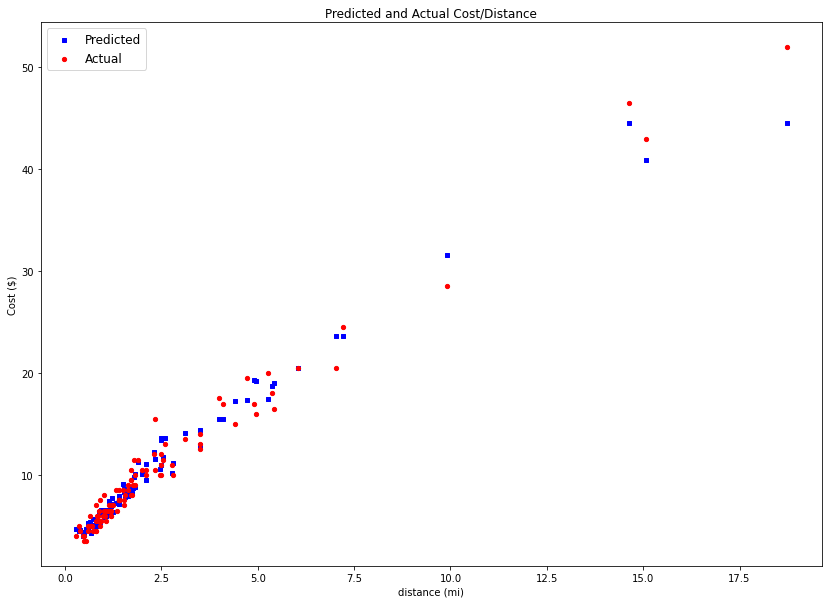

In [27]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(14, 10))
ax1 = fig.add_subplot(111)

distance_vals = [x[0] for x in x_test.values]

ax1.scatter(distance_vals[:100], y_predict[:100], s=18, c='b', marker="s", label='Predicted')
ax1.scatter(distance_vals[:100], y_actual[:100], s=18, c='r', marker="o", label='Actual')

ax1.set_xlabel('distance (mi)')
ax1.set_title('Predicted and Actual Cost/Distance')
ax1.set_ylabel('Cost ($)')

plt.legend(loc='upper left', prop={'size': 12})
plt.rcParams.update({'font.size': 14})
plt.show()

# once we are happy with our model we can save 

In [28]:
import joblib
from  azureml.interpret.scoring  import scoring_explainer

# Save the trained model in the outputs folder
print("Saving model...")
os.makedirs('outputs', exist_ok=True)
model_file = os.path.join('outputs', 'NYC_taxi_model.pkl')
joblib.dump(value=fitted_model, filename=model_file)


# Register the model
print('Registering model...')
Model.register(workspace=ws,
               model_path = model_file,
               model_name = 'NYC_taxi_model',
               tags={'Training context':'Pipeline'},
               )


Saving model...
Registering model...
Registering model NYC_taxi_model


Model(workspace=Workspace.create(name='training-ml104', subscription_id='40fd749f-c876-4e1e-87c0-835314a59e42', resource_group='dp100-main-demo'), name=NYC_taxi_model, id=NYC_taxi_model:4, version=4, tags={'Training context': 'Pipeline'}, properties={})

In [29]:
# lets publish our pipeline!
# Again RBAC restrictions: https://learn.microsoft.com/en-us/azure/machine-learning/how-to-assign-roles?tabs=labeler#common-scenarios

import requests
from azureml.pipeline.core import PublishedPipeline
date = "coffee"

published_pipeline = pipeline_run.publish_pipeline(name=f'autoMl_pipeline_{date}',
                                          description='Model training pipeline',
                                          version='1.0')


## working with your pipeline

To use the endpoint, client applications need to make a REST call over HTTP. This request must be authenticated, so an authorization header is required. A real application would require a service principal with which to be authenticated, but as a demo, we just use fromt he browser

In [32]:
# retrieve pipeline

from azureml.core.authentication import InteractiveLoginAuthentication

interactive_auth = InteractiveLoginAuthentication()
auth_header = interactive_auth.get_authentication_header()
print("Authentication header ready.")

experiment_name = f'autoMl_pipeline_{date}'

response = requests.post(
    published_pipeline.endpoint,
    headers=auth_header,
    json={"ExperimentName": experiment_name}
)
run_id = response.json()["Id"]


run_id

Authentication header ready.


'a07b6716-cad6-4e0e-a9ae-93a7a77e8a39'

In [34]:
from azureml.pipeline.core.run import PipelineRun

published_pipeline_run = PipelineRun(ws.experiments[experiment_name], run_id)
published_pipeline_run.wait_for_completion(show_output=True)


PipelineRunId: a07b6716-cad6-4e0e-a9ae-93a7a77e8a39
Link to Azure Machine Learning Portal: https://ml.azure.com/runs/a07b6716-cad6-4e0e-a9ae-93a7a77e8a39?wsid=/subscriptions/40fd749f-c876-4e1e-87c0-835314a59e42/resourcegroups/dp100-main-demo/workspaces/training-ml104&tid=9d155888-3191-4c87-af15-230decffdf17

PipelineRun Execution Summary
PipelineRun Status: Finished
{'runId': 'a07b6716-cad6-4e0e-a9ae-93a7a77e8a39', 'status': 'Completed', 'startTimeUtc': '2022-12-13T13:48:01.159516Z', 'endTimeUtc': '2022-12-13T13:55:03.851559Z', 'services': {}, 'properties': {'azureml.runsource': 'azureml.PipelineRun', 'runSource': 'Unavailable', 'runType': 'HTTP', 'azureml.parameters': '{}', 'azureml.continue_on_step_failure': 'False', 'azureml.continue_on_failed_optional_input': 'True', 'azureml.pipelineid': 'fe6b9a2b-cb7a-4515-b34b-c2e9dbfd8f8f', 'azureml.pipelineComponent': 'pipelinerun', 'azureml.pipelines.stages': '{"Initialization":null,"Execution":{"StartTime":"2022-12-13T13:48:01.4870234+00:00"

'Finished'

In [40]:
from azureml.pipeline.core import Schedule, ScheduleRecurrence


# I can schedule my pipeline
recurrence = ScheduleRecurrence(frequency="Week", interval=1, week_days=["Monday"], time_of_day="00:00")
weekly_schedule = Schedule.create(ws, name="weekly-taxi-training", 
                                  description="Based on time",
                                  pipeline_id=published_pipeline.id, 
                                  experiment_name='weekly-taxi-pipeline', 
                                  recurrence=recurrence)
print('Pipeline scheduled.')

Pipeline scheduled.


In [ ]:
from azureml.pipeline.core.schedule import ScheduleRecurrence,create

# Explainability of my automl model 

We dive into this topic in Module 9 but yes, we can assess how well our model is doing. 

**References:**

https://learn.microsoft.com/en-us/azure/machine-learning/v1/how-to-machine-learning-interpretability-automl

https://techcommunity.microsoft.com/t5/ai-machine-learning-blog/model-understanding-with-azure-machine-learning/ba-p/2201141

In [25]:
from azureml.interpret import ExplanationClient
#best_run, fitted_model = automl_run.get_output()


from azureml.train.automl.runtime.automl_explain_utilities import automl_setup_model_explanations

X_train = fetch_df(split_step, output_split_train.name)[features]
y_train = fetch_df(split_step, output_split_train.name)[target]


client = ExplanationClient.from_run(best_run)
engineered_explanations = client.download_model_explanation(raw=False)


INFO:interpret_community.common.explanation_utils:Using default datastore for uploads


In [26]:

automl_explainer_setup_obj = automl_setup_model_explanations(fitted_model, X=X_train, 
                                                             X_test=x_test, y=y_train, 
                                                             task='regression')

Current status: Setting up data for AutoML explanations
Current status: Setting up the AutoML featurizer
Current status: Setting up the AutoML estimator
Current status: Setting up the AutoML featurization for explanations
Current status: Using 4283 evaluation samples
Current status: Generating a feature map for raw feature importance
Current status: Choosing the surrogate model as LightGBM for the AutoML model
Current status: Data for AutoML explanations successfully setup


In [27]:
from azureml.interpret import MimicWrapper

# Initialize the Mimic Explainer
explainer = MimicWrapper(ws, automl_explainer_setup_obj.automl_estimator,
                         explainable_model=automl_explainer_setup_obj.surrogate_model, 
                         init_dataset=automl_explainer_setup_obj.X_transform, run=automl_run,
                         features=automl_explainer_setup_obj.engineered_feature_names, 
                         feature_maps=[automl_explainer_setup_obj.feature_map],
                         classes=automl_explainer_setup_obj.classes,
                         explainer_kwargs=automl_explainer_setup_obj.surrogate_model_params)

In [28]:
#!pip install interpret-community[visualization]

engineered_explanations = explainer.explain(['local', 'global'], eval_dataset=automl_explainer_setup_obj.X_test_transform)
print(engineered_explanations.get_feature_importance_dict()),

INFO:interpret_community.common.explanation_utils:Using default datastore for uploads


{'distance_MeanImputer': 6.087969173697209, 'passengers_CharGramCountVectorizer_1': 0.12914407954789192, 'pickup_weekday_CharGramCountVectorizer_6': 0.09062883598319488, 'vendor_ModeCatImputer_LabelEncoder': 0.08964992850148167, 'pickup_weekday_CharGramCountVectorizer_0': 0.0839697298140159, 'pickup_weekday_CharGramCountVectorizer_5': 0.076470493764975, 'pickup_hour_CharGramCountVectorizer_15': 0.057363663565227076, 'pickup_hour_CharGramCountVectorizer_23': 0.05395329065418282, 'pickup_hour_CharGramCountVectorizer_11': 0.05136654233422362, 'pickup_hour_CharGramCountVectorizer_16': 0.045942913553433586, 'pickup_hour_CharGramCountVectorizer_17': 0.04154492742164759, 'pickup_weekday_CharGramCountVectorizer_1': 0.03506141066755472, 'pickup_hour_CharGramCountVectorizer_8': 0.033922349134186305, 'pickup_hour_CharGramCountVectorizer_18': 0.03250117998049172, 'pickup_weekday_CharGramCountVectorizer_4': 0.030589320562257005, 'passengers_CharGramCountVectorizer_2': 0.029228044776159028, 'pickup_

(None,)

In [29]:
from azureml.train.automl.runtime.automl_explain_utilities import AutoMLExplainerSetupClass, automl_setup_model_explanations
from raiwidgets import ExplanationDashboard

ExplanationDashboard(engineered_explanations, automl_explainer_setup_obj.automl_estimator)


INFO:interpret_community.common.explanation_utils:Using default datastore for uploads


Interpret started at https://littlevmboithesecond-5000.westeurope.instances.azureml.ms
